<a href="https://colab.research.google.com/github/SRINIVASDEVARAJULA/Week2_G2M_CAB/blob/main/G2M_insight_for_Cab_Investment_firm_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Business problem:**

XYZ is a private firm in US. Due to remarkable growth in the Cab Industry in last few years and multiple key players in the market, it is planning for an investment in Cab industry and as per their Go-to-Market(G2M) strategy they want to understand the market before taking final decision.

# **Data Set:** 

Data have been provided in 4 individual data sets. Time period of data is from 31/01/2016 to 31/12/2018.

Below are the list of datasets which are provided for the analysis:

Cab_Data.csv – this file includes details of transaction for 2 cab companies

Customer_ID.csv – this is a mapping table that contains a unique identifier which links the customer’s demographic details

Transaction_ID.csv – this is a mapping table that contains transaction to customer mapping and payment mode

City.csv – this file contains list of US cities, their population and number of cab users

# **Areas to investigate:**


 - Which company has maximum cab users at a particular time period?

 - Does margin proportionally increase with increase in number of customers?

 - What are the attributes of these customer segments?




In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 22.0 MB 159 kB/s
     |████████████████████████████████| 102 kB 7.8 MB/s 
     |████████████████████████████████| 679 kB 46.3 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 9.9 MB 46.3 MB/s 
     |████████████████████████████████| 4.7 MB 51.3 MB/s 
     |████████████████████████████████| 296 kB 46.5 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-dev-py2.py3-none-any.whl size=324949 sha256=22c47b5239f6ece91ac40a95a416aeed989233818e2c7632fbe0fe8459f371a5
  Stored in directory: /tmp/pip-ephem-wheel-cache-7q7d_0d2/wheels/64/b6/85/dfc808b23666a5910371784e349d28818006ff63ed9cfeca59
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=43a296ceb5a70d0210629cea358154ba89166625030fdc2995289ebf5951dc6e
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b

In [61]:
import pandas as pd
import numpy as np
import seaborn as sns
from pandas_profiling import ProfileReport
import pandas_profiling
from sklearn import datasets
import matplotlib.pyplot as plt
from scipy import stats
import plotly.express as px
import plotly.graph_objs as go
import plotly
import plotly.graph_objects as go
import datetime

In [ ]:
city=pd.read_csv("/content/City.csv")
cab=pd.read_csv("/content/Cab_Data.csv")
customer=pd.read_csv("/content/Customer_ID.csv")
transaction=pd.read_csv("/content/Transaction_ID.csv")

# **Profiling city**

**Used profiling to get statistics about each coulmn in citydata 
Used Profiling to know categorical,numeric types in citydata
profiling shows whole data satistics,Displays each column Distinct,Missing,Null,Unique values and correlation between all columns in dataset.** 

In [ ]:
profile_city = ProfileReport(city, title="Pandas Profiling City Report")

In [ ]:
print("city Feature's datatypes \n{}".format(city.dtypes))

city Feature's datatypes 
City          object
Population    object
Users         object
dtype: object


In [ ]:
profile_city

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_cab = ProfileReport(cab, title="Pandas Profiling Cab Report")

In [ ]:
print("cab Feature's datatypes \n{}".format(cab.dtypes))

cab Feature's datatypes 
Transaction ID      int64
Date of Travel      int64
Company            object
City               object
KM Travelled      float64
Price Charged     float64
Cost of Trip      float64
dtype: object


In [ ]:
profile_cab

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
print("customer_Id Feature's datatypes \n{}".format(customer.dtypes))

customer_Id Feature's datatypes 
Customer ID            int64
Gender                object
Age                    int64
Income (USD/Month)     int64
dtype: object


In [ ]:
profile_customer = ProfileReport(customer, title="Pandas Profiling Customer Report")
profile_customer

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
print("Transaction_Id Feature's datatypes \n{}".format(transaction.dtypes))

Transaction_Id Feature's datatypes 
Transaction ID     int64
Customer ID        int64
Payment_Mode      object
dtype: object


In [ ]:
profile_Transaction = ProfileReport(transaction, title="Pandas Profiling Transaction Report")
profile_Transaction

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
masterdata = pd.merge(transaction, customer).merge(cab, on='Transaction ID' ).merge(city, on = 'City')
print("\nMaster_Data Feature's datatypes\n\n{}".format(masterdata.dtypes))


Master_Data Feature's datatypes

Transaction ID          int64
Customer ID             int64
Payment_Mode           object
Gender                 object
Age                     int64
Income (USD/Month)      int64
Date of Travel          int64
Company                object
City                   object
KM Travelled          float64
Price Charged         float64
Cost of Trip          float64
Population             object
Users                  object
dtype: object


# ***Data Cleaning*** 

#removing ',' in population and users column values and replacing spaces with '_' in column names 

In [ ]:


for column in masterdata.columns:
    if ' ' in column:
        masterdata = masterdata.rename(columns={column:column.replace(' ','_')})
        
for column in ["Population","Users"] :
    
        masterdata[column] = masterdata[column].str.replace(',','')
        

# Converted few columns from object to category/int64 datatypes

In [ ]:


for column in ["Company", "City" , "Payment_Mode" , "Gender" ] :
    
        masterdata[column] = masterdata[column].astype('category')
        
        
for column in ["Population", "Users" ] :
    
        masterdata[column] = masterdata[column].astype('int64')
        
print("\nFeature's datatypes\n\n{}".format(masterdata.dtypes))


Feature's datatypes

Transaction_ID           int64
Customer_ID              int64
Payment_Mode          category
Gender                category
Age                      int64
Income_(USD/Month)       int64
Date_of_Travel           int64
Company               category
City                  category
KM_Travelled           float64
Price_Charged          float64
Cost_of_Trip           float64
Population               int64
Users                    int64
dtype: object


#converting datetime column to datetime, year, month columns for analysis.

In [ ]:
from datetime import datetime, timedelta
def to_date_format(n):
    date_str =(datetime(1899,12,30) + timedelta(n-1)).strftime("%d-%m-%Y")
    date_date =  datetime.strptime(date_str, "%d-%m-%Y")
    return date_date

masterdata['Date_of_Travel']=masterdata['Date_of_Travel'].apply(lambda x:to_date_format(x))
masterdata['year'] = masterdata['Date_of_Travel'].dt.year
masterdata['month'] = pd.DatetimeIndex(masterdata['Date_of_Travel']).month

In [ ]:
masterdata.head()

,Transaction_ID,Customer_ID,Payment_Mode,Gender,Age,Income_(USD/Month),Date_of_Travel,Company,City,KM_Travelled,Price_Charged,Cost_of_Trip,Population,Users,year,month
0,10000011,29290,Card,Male,28,10813,2016-01-07,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,814885,24701,2016,1
1,10351127,29290,Cash,Male,28,10813,2018-07-20,Yellow Cab,ATLANTA GA,26.19,598.70,317.4228,814885,24701,2018,7
2,10412921,29290,Card,Male,28,10813,2018-11-22,Yellow Cab,ATLANTA GA,42.55,792.05,597.4020,814885,24701,2018,11
3,10000012,27703,Card,Male,27,9237,2016-01-05,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,814885,24701,2016,1
4,10320494,27703,Card,Male,27,9237,2018-04-20,Yellow Cab,ATLANTA GA,36.38,721.10,467.1192,814885,24701,2018,4


In [ ]:
print("masterdata_Id Feature's datatypes \n{}".format(masterdata.dtypes))

masterdata_Id Feature's datatypes 
Transaction_ID                 int64
Customer_ID                    int64
Payment_Mode                category
Gender                      category
Age                            int64
Income_(USD/Month)             int64
Date_of_Travel        datetime64[ns]
Company                     category
City                        category
KM_Travelled                 float64
Price_Charged                float64
Cost_of_Trip                 float64
Population                     int64
Users                          int64
year                           int64
month                          int64
dtype: object


In [ ]:
profile_masterdata = ProfileReport(masterdata, title="Pandas Profiling masterdata Report")
profile_masterdata

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Comment:**
From masterdata profiling there is no null,missing values. 

# **Data Analysis**



**In this section , I analyzed statinfos , distributions , outliers , boxplots , correlations , covariance and so on of some columns of entire MasterData.**

In [29]:
# Here I splitted masterdata into two dataset for every Cab Firm to analyze them individually.
Pink_masterdata = masterdata [masterdata['Company'] == 'Pink Cab'] 
Yellow_masterdata = masterdata [masterdata['Company'] == 'Yellow Cab']
selected_columns = ['KM_Travelled','Price_Charged','Cost_of_Trip', 'Age' ,'Income_(USD/Month)', 'Population' , 'Users']

**outlier detection**

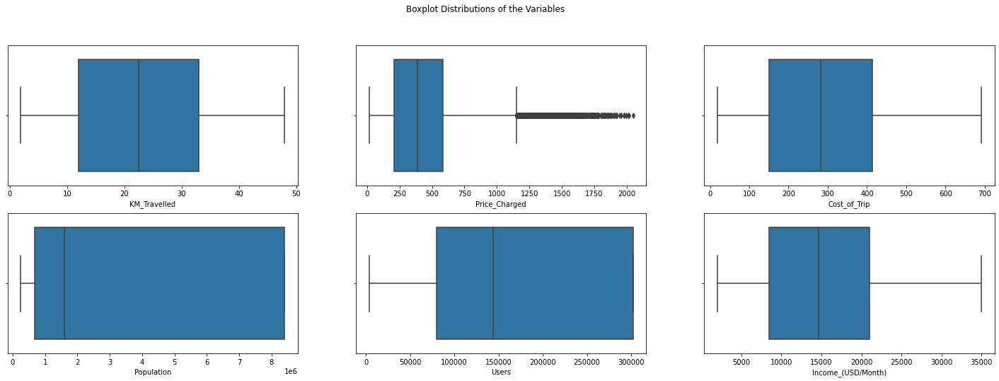

In [27]:
fig,axes = plt.subplots(2, 3, figsize=(25, 8), sharey=True)
fig.suptitle('Boxplot Distributions of the Variables')
masterdatadata=masterdata
sns.boxplot(ax=axes[0,0], x='KM_Travelled' , data=masterdata)
sns.boxplot(ax=axes[0,1], x='Price_Charged'  , data=masterdata) 
sns.boxplot(ax=axes[0,2], x='Cost_of_Trip' ,   data=masterdata)
sns.boxplot(ax=axes[1,0], x='Population' ,   data=masterdata)
sns.boxplot(ax=axes[1,1], x='Users' ,   data=masterdata)
sns.boxplot(ax=axes[1,2], x='Income_(USD/Month)' ,   data=masterdata)

In [32]:
def outlier(col:str, df_:pd.DataFrame=masterdata, remove:bool=False) -> list:
    """This function calculates the upper and lower fence
    of any column and can also remove from the dataset"""
    q1 = df_[col].quantile(0.25)
    q3 = df_[col].quantile(0.75)
    
    iqr = q3-q1
    lower_fence = q1 - iqr*1.5
    upper_fence = q3 + iqr*1.5

    if remove:
        temp = df_[(df_[col] > lower_fence) & (df_[col] < upper_fence)]
        return temp
    print('Upper and Lower Limits of KM_Travelled is:')
    return  [lower_fence, upper_fence]
outlier('Price_Charged')

Upper and Lower Limits of KM_Travelled is:


[-359.39625, 1149.49375]

In [35]:
# Here I splitted masterdata into two dataset for every Cab Firm to analyze them individually.
Pink_MasterData = masterdata [masterdata['Company'] == 'Pink Cab'] 
Yellow_MasterData = masterdata [masterdata['Company'] == 'Yellow Cab']
selected_columns = ['KM_Travelled','Price_Charged','Cost_of_Trip', 'Age' ,'Income_(USD/Month)', 'Population' , 'Users']

In [36]:
# Getting the statinfo's of selected columns from MasterData for Pink Cab Firm
filtered_Pink_MasterData = Pink_MasterData[selected_columns]
Pink_Cab_StatsInfo = filtered_Pink_MasterData.describe()
Pink_Cab_StatsInfo

,KM_Travelled,Price_Charged,Cost_of_Trip,Age,Income_(USD/Month),Population,Users
count,84711.000000,84711.000000,84711.000000,84711.000000,84711.000000,8.471100e+04,84711.000000
mean,22.559917,310.800856,248.148682,35.322414,15059.047137,2.350642e+06,125590.813330
std,12.231092,181.995661,135.403345,12.644780,7991.077762,2.734890e+06,94593.433659
min,1.900000,15.600000,19.000000,18.000000,2000.000000,2.489680e+05,3643.000000
25%,12.000000,159.970000,131.868000,25.000000,8371.000000,8.148850e+05,27247.000000
50%,22.440000,298.060000,246.330000,33.000000,14713.000000,1.595037e+06,144132.000000
75%,32.960000,441.505000,360.180000,42.000000,21055.000000,1.955130e+06,164468.000000
max,48.000000,1623.480000,576.000000,65.000000,35000.000000,8.405837e+06,302149.000000


In [37]:
# Getting the statinfo's of selected columns from MasterData for Pink Cab Firm
filtered_Yellow_MasterData = Yellow_MasterData[selected_columns]
Yellow_Cab_StatsInfo = filtered_Yellow_MasterData.describe()
Yellow_Cab_StatsInfo

,KM_Travelled,Price_Charged,Cost_of_Trip,Age,Income_(USD/Month),Population,Users
count,274681.000000,274681.000000,274681.000000,274681.000000,274681.000000,2.746810e+05,274681.000000
mean,22.569517,458.181990,297.922004,35.341112,15045.669817,3.373228e+06,168473.246981
std,12.234298,288.386166,162.548986,12.578625,7962.727062,3.439014e+06,100570.558887
min,1.900000,20.730000,22.800000,18.000000,2000.000000,2.489680e+05,3643.000000
25%,11.990000,226.680000,158.400000,25.000000,8439.000000,6.712380e+05,80021.000000
50%,22.440000,425.060000,295.596000,33.000000,14676.000000,1.595037e+06,144132.000000
75%,32.960000,633.880000,432.432000,42.000000,21023.000000,8.405837e+06,302149.000000
max,48.000000,2048.030000,691.200000,65.000000,34996.000000,8.405837e+06,302149.000000


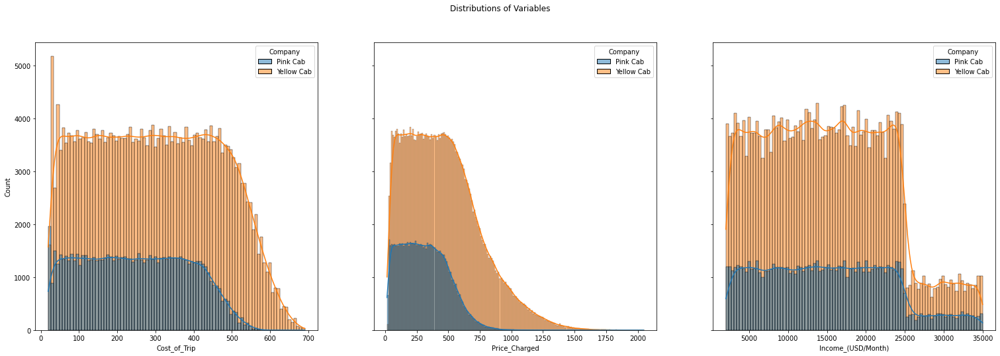

In [39]:
#The KDE curves and distribtion plots of selected variables with respect to Cab Firms drawn below.
fig,axes = plt.subplots(1, 3 , figsize=(26,8), sharey=True)
fig.suptitle('Distributions of Variables')
sns.histplot(ax=axes[0], data=masterdata , x='Cost_of_Trip' , kde = True , hue="Company")
sns.histplot(ax=axes[1], data=masterdata , x='Price_Charged' , kde = True , hue="Company")
sns.histplot(ax=axes[2], data=masterdata , x='Income_(USD/Month)' , kde = True , hue="Company") 

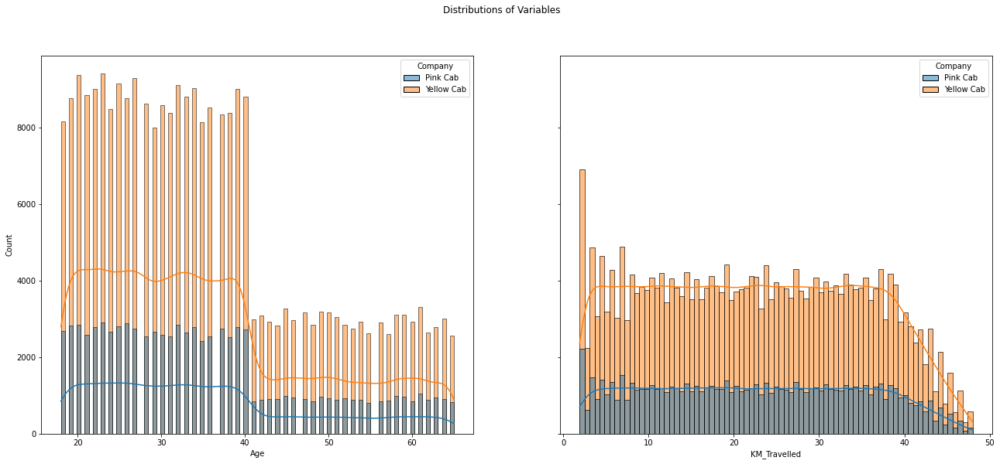

In [41]:
#The KDE curves and distribtion plots of selected variables with respect to Cab Firms drawn below.
fig,axes = plt.subplots(1, 2 ,figsize=(22,9), sharey=True)
fig.suptitle('Distributions of Variables')
sns.histplot(ax=axes[0],data=masterdata , x='Age' , kde = True , hue="Company")
sns.histplot(ax=axes[1], data=masterdata , x='KM_Travelled' , kde = True , hue="Company")

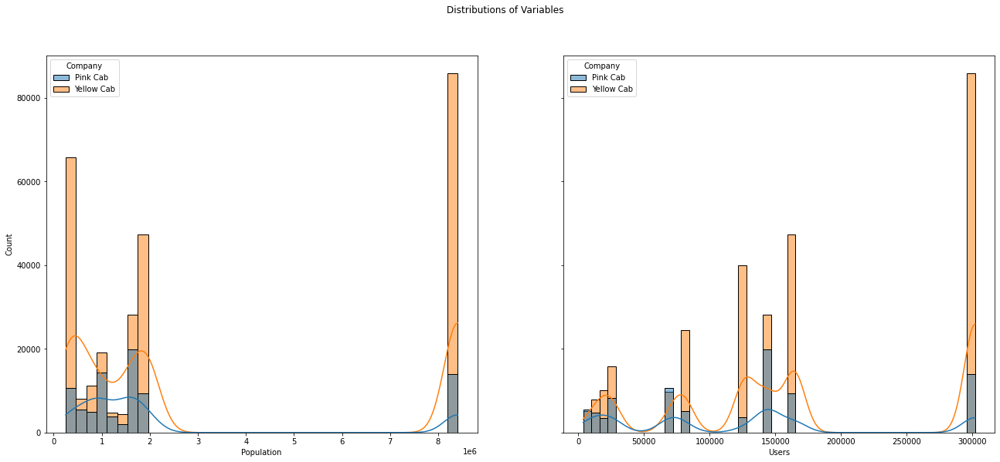

In [42]:
#The KDE curves and distribtion plots of selected variables with respect to Cab Firms drawn below.
fig,axes = plt.subplots(1, 2 , figsize=(22 ,9), sharey=True)
fig.suptitle('Distributions of Variables')
sns.histplot(ax=axes[0], data=masterdata , x='Population' , kde = True , hue="Company")
sns.histplot(ax=axes[1], data=masterdata , x='Users' , kde = True , hue="Company")

Text(0, 0.5, 'Yellow Cab')

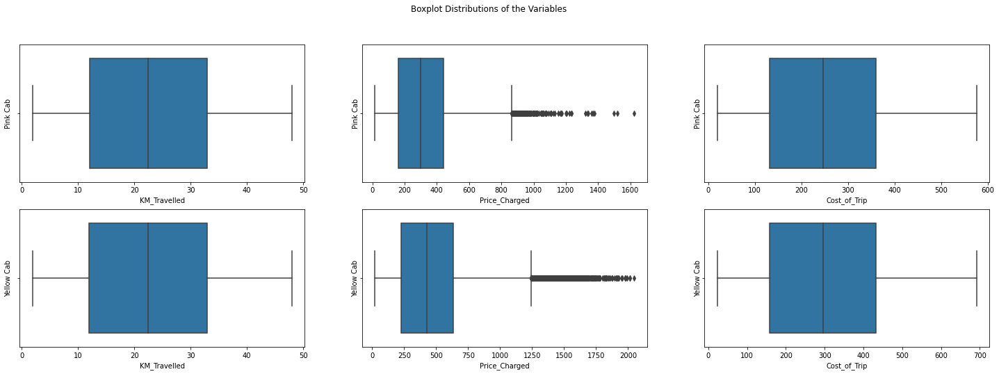

In [45]:
#Boxplot distributions of the desired variables were drawn.
MasterData=masterdata
fig,axes = plt.subplots(2, 3, figsize=(25, 8), sharey=True)
fig.suptitle('Boxplot Distributions of the Variables')

sns.boxplot(ax=axes[0,0], x='KM_Travelled' ,        data=filtered_Pink_MasterData ).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[0,1], x='Price_Charged'   ,     data=filtered_Pink_MasterData  ) .set_ylabel("Pink Cab")
sns.boxplot(ax=axes[0,2], x='Cost_of_Trip' ,        data=filtered_Pink_MasterData ).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[1,0], x='KM_Travelled' ,        data=filtered_Yellow_MasterData ).set_ylabel("Yellow Cab")
sns.boxplot(ax=axes[1,1], x='Price_Charged'   ,     data=filtered_Yellow_MasterData  ) .set_ylabel("Yellow Cab")
sns.boxplot(ax=axes[1,2], x='Cost_of_Trip' ,        data=filtered_Yellow_MasterData ).set_ylabel("Yellow Cab")

Text(0, 0.5, 'Yellow Cab')

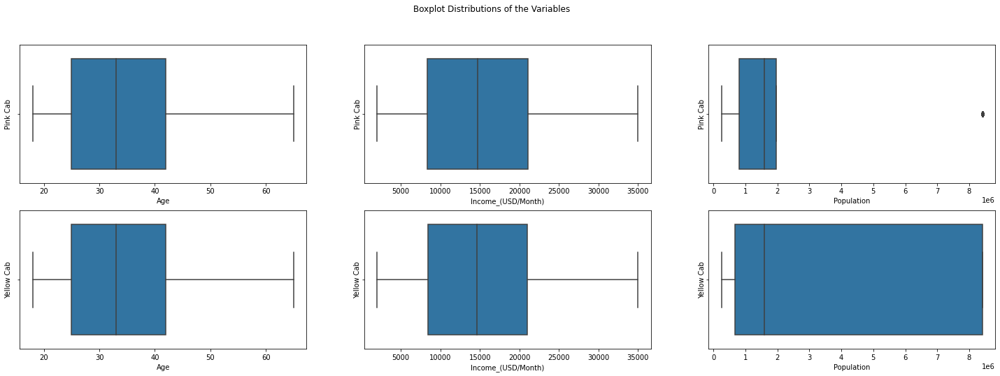

In [46]:
#Boxplot distributions of the desired variables were drawn.
fig,axes = plt.subplots(2, 3, figsize=(25, 8), sharey=True)
fig.suptitle('Boxplot Distributions of the Variables')
sns.boxplot(ax=axes[0,0], x='Age' ,                 data=filtered_Pink_MasterData ).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[0,1], x='Income_(USD/Month)' ,  data=filtered_Pink_MasterData  ) .set_ylabel("Pink Cab")
sns.boxplot(ax=axes[0,2], x='Population' ,          data=filtered_Pink_MasterData ).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[1,0], x='Age' ,                 data=filtered_Yellow_MasterData ).set_ylabel("Yellow Cab")
sns.boxplot(ax=axes[1,1], x='Income_(USD/Month)' ,  data=filtered_Yellow_MasterData  ) .set_ylabel("Yellow Cab")
sns.boxplot(ax=axes[1,2], x='Population' ,          data=filtered_Yellow_MasterData ).set_ylabel("Yellow Cab")

Text(0, 0.5, 'Yellow Cab')

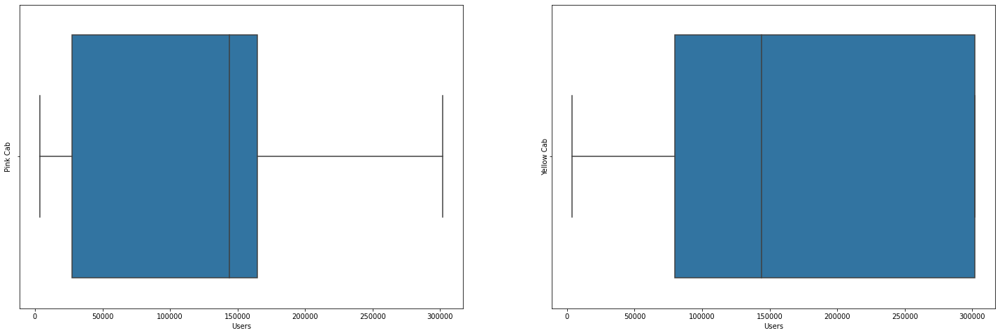

In [47]:
#Boxplot distributions of the desired variables were drawn.
fig,axes = plt.subplots(1, 2, figsize=(25, 8), sharey=True)
sns.boxplot(ax=axes[0], x='Users' ,    data=filtered_Pink_MasterData ).set_ylabel("Pink Cab")
sns.boxplot(ax=axes[1], x='Users'   ,  data=filtered_Yellow_MasterData  ) .set_ylabel("Yellow Cab")

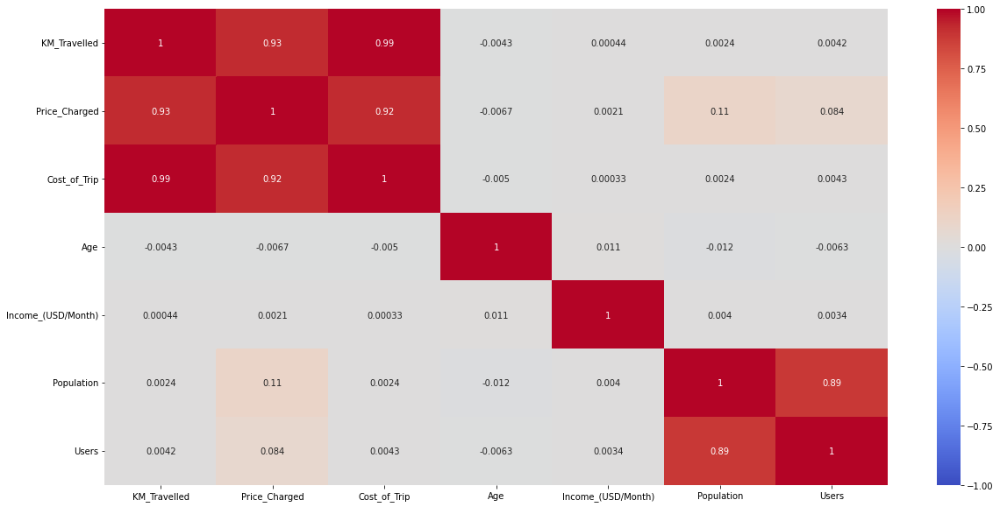

In [48]:
# Here visualized the correlation of MasterData features by heatmap for Pink Cab Firm.
Pink_Cab_Corr = filtered_Pink_MasterData.corr()
plt.figure(figsize=(20,10))
sns.heatmap(Pink_Cab_Corr,annot=True,vmin=-1,vmax=1,cmap='coolwarm')

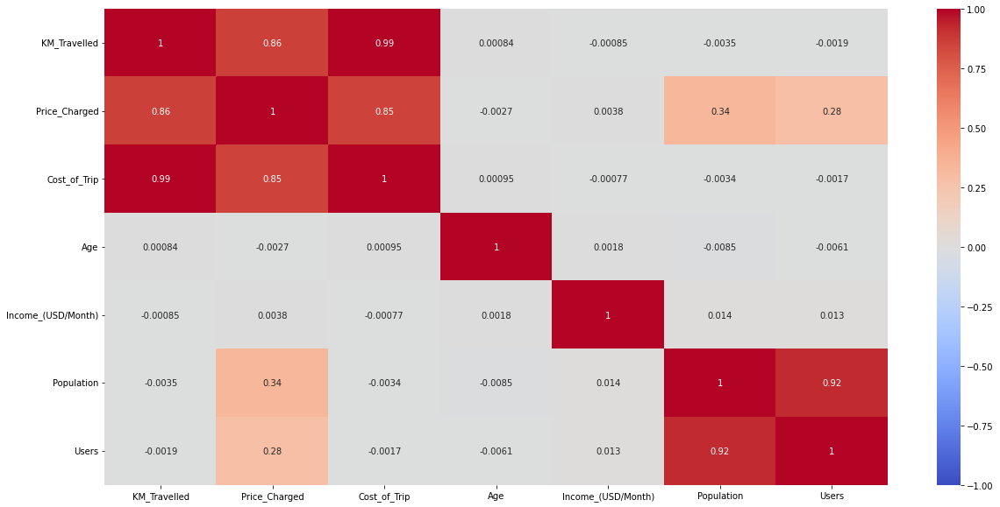

In [49]:
# Here visualized the correlation of MasterData features by heatmap for Pink Cab Firm.
Yellow_Cab_Corr = filtered_Yellow_MasterData.corr()
plt.figure(figsize=(20,10))
sns.heatmap(Yellow_Cab_Corr,annot=True,vmin=-1,vmax=1,cmap='coolwarm')

Text(0.5, 1.0, 'KM_Travelled  - Cost_of_Trip')

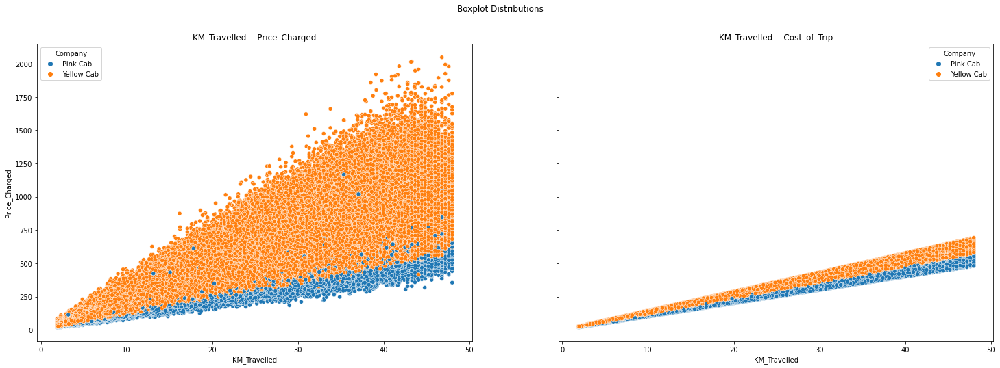

In [50]:
# Here visualized scatter plots of MasterData features to see correlations between them if exists
fig,axes = plt.subplots(1, 2, figsize=(25, 8), sharey=True)
fig.suptitle('Boxplot Distributions')
sns.scatterplot(ax=axes[0],data=MasterData, x='KM_Travelled', y='Price_Charged' , hue="Company"  ).set_title("KM_Travelled  - Price_Charged")
sns.scatterplot(ax=axes[1],data=MasterData, x='KM_Travelled', y='Cost_of_Trip' , hue="Company").set_title("KM_Travelled  - Cost_of_Trip")

Text(0.5, 1.0, 'Price_Charged - Cost_of_Trip')

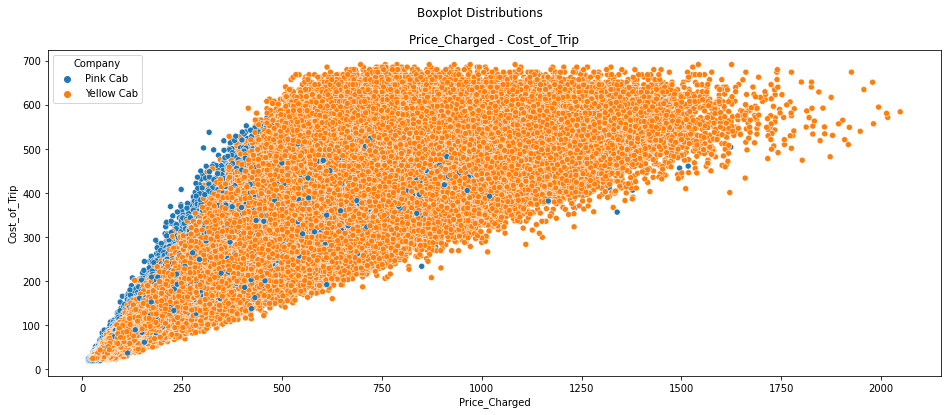

In [51]:
# Here visualized scatter plots of MasterData features to see correlations between them if exists
fig,axes = plt.subplots(figsize=(16, 6), sharey=True)
fig.suptitle('Boxplot Distributions')
sns.scatterplot(data=MasterData, x='Price_Charged', y='Cost_of_Trip' , hue="Company").set_title("Price_Charged - Cost_of_Trip")

Text(0.5, 1.0, 'Population  - Users')

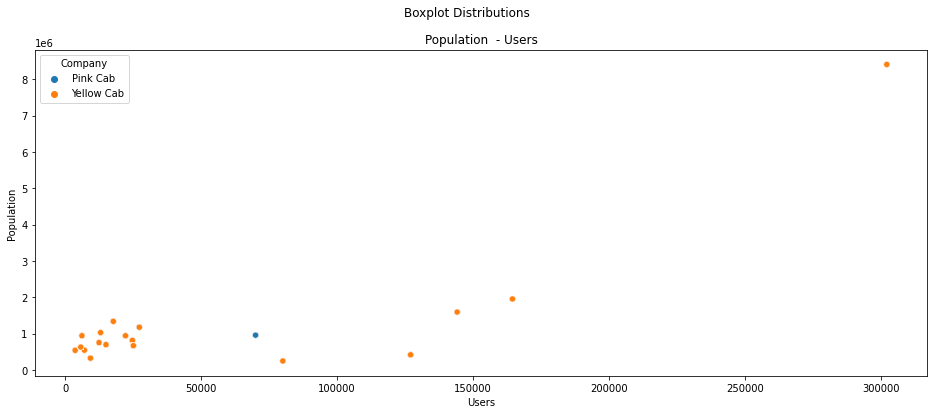

In [52]:
# Here visualized scatter plots of MasterData features to see correlations between them if exists
fig,axes = plt.subplots(figsize=(16, 6), sharey=True)
fig.suptitle('Boxplot Distributions')
sns.scatterplot(data=MasterData, x='Users', y='Population' , hue="Company"  ).set_title("Population  - Users")

Text(0.5, 1.0, 'Users - Price_Charged')

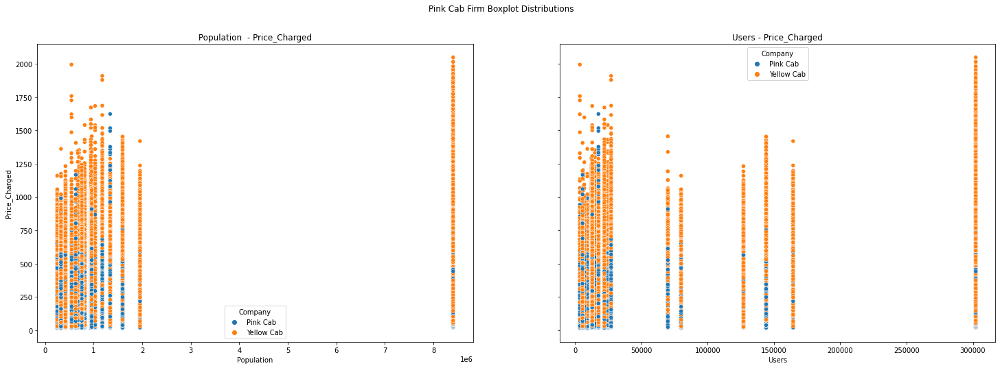

In [53]:
# Here visualized scatter plots of MasterData features to see correlations between them if exists
fig,axes = plt.subplots(1, 2, figsize=(25, 8), sharey=True)
fig.suptitle('Pink Cab Firm Boxplot Distributions')
sns.scatterplot(ax=axes[0],data=MasterData, x='Population', y='Price_Charged' , hue="Company").set_title("Population  - Price_Charged")
sns.scatterplot(ax=axes[1],data=MasterData, x='Users', y='Price_Charged' , hue="Company").set_title("Users - Price_Charged")

In [54]:
# Obtained covariance values for given features.

cov1  = np.cov(MasterData['KM_Travelled'],MasterData['Price_Charged'])[0][1]
cov2  = np.cov(MasterData['KM_Travelled'],MasterData['Cost_of_Trip'])[0][1]
cov3  = np.cov(MasterData['Price_Charged'],MasterData['Cost_of_Trip'])[0][1]
cov4  = np.cov(MasterData['Users'],MasterData['Population'])[0][1]
cov5  = np.cov(MasterData['Population'],MasterData['Price_Charged'])[0][1]
cov6  = np.cov(MasterData['Users'],MasterData['Price_Charged'])[0][1]

print('Covariance for  KM_Travelled - Price_Charged : '+ str(cov1))
print('Covariance for  KM_Travelled - Cost_of_Trip : '+ str(cov2))
print('Covariance for  Price_Charged - Cost_of_Trip : '+ str(cov3))
print('Covariance for  Users - Population : '+ str(cov4))
print('Covariance for  Population - Price_Charged : '+ str(cov5))
print('Covariance for  Users - Price_Charged : '+ str(cov6))

Covariance for  KM_Travelled - Price_Charged : 2805.307041308072
Covariance for  KM_Travelled - Cost_of_Trip : 1897.7357483737026
Covariance for  Price_Charged - Cost_of_Trip : 37272.94904600311
Covariance for  Users - Population : 306082774585.4567
Covariance for  Population - Price_Charged : 297071855.0581955
Covariance for  Users - Price_Charged : 7777261.839139369


In [58]:
# Obtained pearson correlation coefficients for given features.

pcorr_coef1 , _ = stats.pearsonr(MasterData['KM_Travelled'],MasterData['Price_Charged'])
pcorr_coef2 , _ = stats.pearsonr(MasterData['KM_Travelled'],MasterData['Cost_of_Trip'])
pcorr_coef3 , _ = stats.pearsonr(MasterData['Price_Charged'],MasterData['Cost_of_Trip'])
pcorr_coef4 , _ = stats.pearsonr(MasterData['Users'],MasterData['Population'])
pcorr_coef5 , _ = stats.pearsonr(MasterData['Population'],MasterData['Price_Charged'])
pcorr_coef6 , _ = stats.pearsonr(MasterData['Users'],MasterData['Price_Charged'])

print('pearson correlation coefficient for  KM_Travelled - Price_Charged : '+ str(pcorr_coef1))
print('pearson correlation coefficient for  KM_Travelled - Cost_of_Trip : '+ str(pcorr_coef2))
print('pearson correlation coefficient for  Price_Charged - Cost_of_Trip : '+ str(pcorr_coef3))
print('pearson correlation coefficient for  Users - Population : '+ str(pcorr_coef4))
print('pearson correlation coefficient for  Population - Price_Charged : '+ str(pcorr_coef5))
print('pearson correlation coefficient for  Users - Price_Charged : '+ str(pcorr_coef6))

pearson correlation coefficient for  KM_Travelled - Price_Charged : 0.835753158020941
pearson correlation coefficient for  KM_Travelled - Cost_of_Trip : 0.9818483823189937
pearson correlation coefficient for  Price_Charged - Cost_of_Trip : 0.859811726291567
pearson correlation coefficient for  Users - Population : 0.9154903444758953
pearson correlation coefficient for  Population - Price_Charged : 0.32658917101926577
pearson correlation coefficient for  Users - Price_Charged : 0.2810605356919121


In [59]:
# Obtained spearman rank correlations and p - values for given features. 
spearman_rank_coeff1   = stats.spearmanr(MasterData['KM_Travelled'],MasterData['Price_Charged'])
spearman_rank_coeff2   = stats.spearmanr(MasterData['KM_Travelled'],MasterData['Cost_of_Trip'])
spearman_rank_coeff3   = stats.spearmanr(MasterData['Price_Charged'],MasterData['Cost_of_Trip'])
spearman_rank_coeff4   = stats.spearmanr(MasterData['Users'],MasterData['Population'])
spearman_rank_coeff5   = stats.spearmanr(MasterData['Population'],MasterData['Price_Charged'])
spearman_rank_coeff6   = stats.spearmanr(MasterData['Users'],MasterData['Price_Charged'])

print('spearman rank coefficient coefficient for  KM_Travelled - Price_Charged : '+ str(spearman_rank_coeff1))
print('spearman rank coefficient coefficient for  KM_Travelled - Cost_of_Trip : '+ str(spearman_rank_coeff2))
print('spearman rank coefficient coefficient for  Price_Charged - Cost_of_Trip : '+ str(spearman_rank_coeff3))
print('spearman rank coefficient coefficient for  Users - Population : '+ str(spearman_rank_coeff4))
print('spearman rank coefficient coefficient for  Population - Price_Charged : '+ str(spearman_rank_coeff5))
print('spearman rank coefficient coefficient for  Users - Price_Charged : '+ str(spearman_rank_coeff6))

spearman rank coefficient coefficient for  KM_Travelled - Price_Charged : SpearmanrResult(correlation=0.8929579061229219, pvalue=0.0)
spearman rank coefficient coefficient for  KM_Travelled - Cost_of_Trip : SpearmanrResult(correlation=0.9845458363254245, pvalue=0.0)
spearman rank coefficient coefficient for  Price_Charged - Cost_of_Trip : SpearmanrResult(correlation=0.9135811393768467, pvalue=0.0)
spearman rank coefficient coefficient for  Users - Population : SpearmanrResult(correlation=0.8742482215995742, pvalue=0.0)
spearman rank coefficient coefficient for  Population - Price_Charged : SpearmanrResult(correlation=0.20756103314228533, pvalue=0.0)
spearman rank coefficient coefficient for  Users - Price_Charged : SpearmanrResult(correlation=0.19826810856694127, pvalue=0.0)


** From the statistical data analysis ; We see that there is strongly positive correlation between KM_Travelled - Price_Charged , KM_Travelled - Cost_of_Trip , Price_Charged - Cost_of_Trip , Users - Population and also we prove that correlations by using spearman rank correlation , pearson correlation coefficient statistical tests and zero p-values which are lower than 0.05 value to satisfy the correlation values as statistically.**



**4. Inferencial Data Analysis
In this section , I analyzed MasterData and some meaningful pieces of MasterData which are extracted from it to make a sensable decision which Cab Firm is most valueble for investing in future times by taking insights and inferences from data analysis and visualizations with different aspects.**

In [62]:
data0 = MasterData.groupby("Company").count()

fig1 = px.pie(data0,
                        values=data0.Users,
                        names=data0.index ,title="Pink & Yellow Cab Firm Total Users Overview"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; The total number of users of Yellow Cab is approximately 3 times that of Pink Cab.

In [63]:
data1_0 = MasterData[MasterData["Company"] == "Pink Cab"].groupby("City").count()
data1_1 = MasterData[MasterData["Company"] == "Yellow Cab"].groupby("City").count()

fig = go.Figure()
fig.add_trace(go.Bar(
                    x=data1_0.index,
                    y=data1_0['Users'],
                    name='Pink Cab',
                    marker_color='indianred' 
                    ))            
fig.add_trace(go.Bar(
                    x=data1_1.index,
                    y=data1_1['Users'],
                    name='Yellow Cab',
                    marker_color='blue'
                    ))
fig.update_layout(
    yaxis_title="Users",
    title="Pink & Yellow Cab Firm Users Distribution Over City" )

⚫ As seen from this Bar Chart; For the Yellow Cab Company, the highest number of users on a city basis are in New York, Washington and Chicago, while for the Pink Cab Company, the most are in Los Angeles, New York and San Diego.

In [64]:
data2_0 = MasterData.groupby("City").count()
fig1 = px.pie(data2_0,
                        values=data2_0.Users,
                        names=data2_0.index ,title="Total Users Overview by Cities"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; On the basis of cities, the highest number of total users are in New York, Chicago, Los Angeles, Washington and Boston.

In [65]:
MasterData["User_Pop_Ratio"] = MasterData["Users"] / MasterData["Population"]
MasterData["Profit_of_Trip"] = MasterData["Price_Charged"] - MasterData["Cost_of_Trip"]
data2_1 = MasterData.groupby("City").sum()
fig1 = px.pie(data2_1,
                        values=data2_1.Profit_of_Trip,
                        names=data2_1.index ,title="Total Market Profit Share by Cities"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; More than half of the total market profit share on the basis of cities belongs to New York.

In [66]:
pinkData = MasterData[MasterData['Company'] == 'Pink Cab']
yellowData = MasterData[MasterData['Company'] == 'Yellow Cab']

dict1 = {"Pink Cab" : [pinkData["Profit_of_Trip"].sum()] ,"Yellow Cab" : [yellowData["Profit_of_Trip"].sum()] }

data2_2 = pd.DataFrame(dict1).T

fig1 = px.pie(data2_2,
                        values=data2_2[0],
                        names=data2_2.index ,title="Total Market Profit Share by Cab Firms"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; The total market profit share of Yellow Cab is approximately 9 times that of Pink Cab.

In [67]:
data3_0 = MasterData.groupby("Gender").count()
fig1 = px.pie(data3_0,
                        values=data3_0.Users,
                        names=data3_0.index ,title="Total Users Overview by Gender"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; In the distribution of users by gender, there is an approximate 3 to 2 ratio for men and women.

In [68]:
data3_1 = MasterData[MasterData["Company"] == "Pink Cab"].groupby("Gender").count()
data3_2 = MasterData[MasterData["Company"] == "Yellow Cab"].groupby("Gender").count()

fig = go.Figure()
fig.add_trace(go.Bar(
                    x=data3_1.index,
                    y=data3_1['Users'],
                    name='Pink Cab',
                    marker_color='pink' 
                    ))            
fig.add_trace(go.Bar(
                    x=data3_2.index,
                    y=data3_2['Users'],
                    name='Yellow Cab',
                    marker_color='orange'
                    ))
fig.update_layout(
    yaxis_title="Users",
    title="Pink & Yellow Cab Firm Users Distribution Over Gender" )

⚫ As seen from this Bar Chart; When the distribution of users by gender is analyzed on a company basis, while the male-female ratio is 57.6% - 42.4% in Yellow Cab Company, the male-female ratio is 55.9% - 44.1% in Pink Cab Company.

In [69]:
data3_3 = MasterData.groupby("Payment_Mode").count()
fig1 = px.pie(data3_3,
                        values=data3_3.Users,
                        names=data3_3.index ,title="Total Users Overview by Payment Method"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; Considering the payment preferences of all users, the credit card- cash payment ratio is 3 to 2.

In [70]:
ageGroup_Young  = MasterData[(MasterData ["Age"] >= 18) & (MasterData ["Age"] < 25)].count()
ageGroup_Middle = MasterData[(MasterData ["Age"] >= 25) & (MasterData ["Age"] < 40)].count()
ageGroup_Old    = MasterData[(MasterData ["Age"] >= 40) & (MasterData ["Age"] <= 65)].count()

dict = {"25 > Age >= 18 (YOUNG)" : ageGroup_Young ,"40 > Age >= 25 (MIDDLE)" : ageGroup_Middle , "65 >= Age >= 40 (OLD)" : ageGroup_Old }
data4_0 = pd.DataFrame(dict).T

fig1 = px.pie(data4_0 ,
                        values=data4_0.Users,
                        names=data4_0.index ,title="Total Users Overview by Age Groups"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 ) 

⚫ As seen from this Pie Chart; Looking at the age distribution of all users, it is seen that approximately half of them are between the ages of 18-25.¶

In [71]:
ageGroup_Young_Pink    = MasterData[(MasterData ["Age"] >= 18) & (MasterData ["Age"] < 25) & (MasterData["Company"] == "Pink Cab")] .count()
ageGroup_Middle_Pink   = MasterData[(MasterData ["Age"] >= 25) & (MasterData ["Age"] < 40) & (MasterData["Company"] == "Pink Cab")].count()
ageGroup_Old_Pink      = MasterData[(MasterData ["Age"] >= 40) & (MasterData ["Age"] <= 65) & (MasterData["Company"] == "Pink Cab")].count()

ageGroup_Young_Yellow  = MasterData[(MasterData ["Age"] >= 18) & (MasterData ["Age"] < 25) & (MasterData["Company"] == "Yellow Cab")] .count()
ageGroup_Middle_Yellow = MasterData[(MasterData ["Age"] >= 25) & (MasterData ["Age"] < 40) & (MasterData["Company"] == "Yellow Cab")].count()
ageGroup_Old_Yellow    = MasterData[(MasterData ["Age"] >= 40) & (MasterData ["Age"] <= 65) & (MasterData["Company"] == "Yellow Cab")].count()

dict0 = { "25 > Age >= 18 (YOUNG)" : ageGroup_Young_Pink ,"40 > Age >= 25 (MIDDLE)" : ageGroup_Middle_Pink , "65 >= Age >= 40 (OLD)" : ageGroup_Old_Pink }

dict1 = { "25 > Age >= 18 (YOUNG)" : ageGroup_Young_Yellow ,"40 > Age >= 25 (MIDDLE)" : ageGroup_Middle_Yellow , "65 >= Age >= 40 (OLD)" : ageGroup_Old_Yellow }

data4_1 = pd.DataFrame(dict0).T
data4_2 = pd.DataFrame(dict1).T

fig = go.Figure()
fig.add_trace(go.Bar(
                    x=data4_1.index,
                    y=data4_1['Users'],
                    name='Pink Cab',
                    marker_color='pink' 
                    ))            
fig.add_trace(go.Bar(
                    x=data4_2.index,
                    y=data4_2['Users'],
                    name='Yellow Cab',
                    marker_color='orange'
                    ))
fig.update_layout(
    yaxis_title="Users",
    title="Pink & Yellow Cab Firm Users Distributions by Age Groups" )

⚫ As seen from this Bar Chart; Looking at the age distribution of all users in the basis of companies, it is seen that both have the same percentage distribution for every age group .

In [72]:
data5_0 = MasterData.groupby("City")["Income_(USD/Month)"].mean()
data5_0 = pd.DataFrame(data5_0)
fig1 = px.pie(data5_0,
                        values=data5_0["Income_(USD/Month)"],
                        names=data5_0.index ,title="Average Income by Cities"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; The average income of all users by city is approximately equal.

In [73]:
data5_1 = MasterData.groupby("Company")["Income_(USD/Month)"].mean()
data5_1 = pd.DataFrame(data5_1)
fig1 = px.pie(data5_1,
                        values=data5_1["Income_(USD/Month)"],
                        names=data5_1.index ,title="Average Income by Cab Firm"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; The average income of all users by companies is approximately equal.

In [74]:
data5_2 = MasterData.groupby("City")["KM_Travelled"].sum()
data5_2 = pd.DataFrame(data5_2)
fig1 = px.pie(data5_2,
                        values=data5_2["KM_Travelled"],
                        names=data5_2.index ,title="Total KM Travelled by Cities"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; On the basis of cities, the most travelled in KM are New York, Chicago, Los Angeles, Washington and Boston

In [75]:
data5_3 = MasterData.groupby("Company")["KM_Travelled"].sum()
data5_3 = pd.DataFrame(data5_3)
fig1 = px.pie(data5_3,
                        values=data5_3["KM_Travelled"],
                        names=data5_3.index ,title="Total KM Travelled by Cab Firm"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; The total travelled in KM for Yellow Cab is approximately 3 times that of Pink Cab.

In [76]:
MasterData["Profit_per_KM"] = MasterData["Profit_of_Trip"].sum() / MasterData["KM_Travelled"].sum()
data5_4 = MasterData.groupby("City")["Profit_per_KM"].mean()
data5_4 = pd.DataFrame(data5_4)

fig1 = px.pie(data5_4,
                        values=data5_4["Profit_per_KM"],
                        names=data5_4.index ,title="Average Profit per KM Travelled by Cities"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; The average profit per travelled in KM by cities is approximately equal.

In [77]:
data5_5 = MasterData.groupby("Company")["Profit_per_KM"].mean()
data5_5 = pd.DataFrame(data5_5)

fig1 = px.pie(data5_5,
                        values=data5_5["Profit_per_KM"],
                        names=data5_5.index ,title="Average Profit per KM Travelled by Cab Firm"
                        )
fig1.update_traces(
                        textposition='inside',
                        textinfo='percent+label'
                        )
fig1.update_layout( width = 1100 , height = 600 )

⚫ As seen from this Pie Chart; The average profit per travelled in KM by companies is approximately equal.

5. Time Series Analysis

In [78]:
MasterData['Year_of_Travel'] = MasterData['Date_of_Travel'].dt.year
MasterData['Month_of_Travel'] = MasterData['Date_of_Travel'].dt.month
MasterData['Day_of_Travel'] = MasterData['Date_of_Travel'].dt.day

MasterData_TimeSeries=MasterData.set_index('Date_of_Travel')
MasterData_TimeSeries.head(10)

,Transaction_ID,Customer_ID,Payment_Mode,Gender,Age,Income_(USD/Month),Company,City,KM_Travelled,Price_Charged,...,Population,Users,year,month,User_Pop_Ratio,Profit_of_Trip,Profit_per_KM,Year_of_Travel,Month_of_Travel,Day_of_Travel
Date_of_Travel,,,,,,,,,,,,,,,,,,,,,
2016-01-07,10000011,29290,Card,Male,28,10813,Pink Cab,ATLANTA GA,30.45,370.95,...,814885,24701,2016,1,0.030312,57.3150,6.081963,2016,1,7
2018-07-20,10351127,29290,Cash,Male,28,10813,Yellow Cab,ATLANTA GA,26.19,598.70,...,814885,24701,2018,7,0.030312,281.2772,6.081963,2018,7,20
2018-11-22,10412921,29290,Card,Male,28,10813,Yellow Cab,ATLANTA GA,42.55,792.05,...,814885,24701,2018,11,0.030312,194.6480,6.081963,2018,11,22
2016-01-05,10000012,27703,Card,Male,27,9237,Pink Cab,ATLANTA GA,28.62,358.52,...,814885,24701,2016,1,0.030312,23.6660,6.081963,2016,1,5
2018-04-20,10320494,27703,Card,Male,27,9237,Yellow Cab,ATLANTA GA,36.38,721.10,...,814885,24701,2018,4,0.030312,253.9808,6.081963,2018,4,20
2018-05-03,10324737,27703,Cash,Male,27,9237,Yellow Cab,ATLANTA GA,6.18,138.40,...,814885,24701,2018,5,0.030312,50.8912,6.081963,2018,5,3
2018-10-26,10395626,27703,Card,Male,27,9237,Pink Cab,ATLANTA GA,13.39,167.03,...,814885,24701,2018,10,0.030312,25.0960,6.081963,2018,10,26
2016-01-01,10000013,28712,Cash,Male,53,11242,Pink Cab,ATLANTA GA,9.04,125.20,...,814885,24701,2016,1,0.030312,27.5680,6.081963,2016,1,1
2016-09-20,10079404,28712,Card,Male,53,11242,Yellow Cab,ATLANTA GA,39.60,704.30,...,814885,24701,2016,9,0.030312,210.0920,6.081963,2016,9,20


In [79]:
years_list = ["2016","2017","2018"]

def year_pink():
    
    
    
    profit_2016 = round ( MasterData[(MasterData['Year_of_Travel'] == 2016) & (MasterData.Company == "Pink Cab")]["Profit_of_Trip"].sum() ,2)
    profit_2017 = round ( MasterData[(MasterData['Year_of_Travel'] == 2017) & (MasterData.Company == "Pink Cab")]["Profit_of_Trip"].sum() ,2)
    profit_2018 = round ( MasterData[(MasterData['Year_of_Travel'] == 2018) & (MasterData.Company == "Pink Cab")]["Profit_of_Trip"].sum() ,2)
    
    profits = [profit_2016, profit_2017, profit_2018]
    
    return profits

   

def year_yellow():
    
    
    profit_2016 = round ( MasterData[(MasterData['Year_of_Travel'] == 2016) & (MasterData.Company == "Yellow Cab")]["Profit_of_Trip"].sum() ,2)
    profit_2017 = round ( MasterData[(MasterData['Year_of_Travel'] == 2017) & (MasterData.Company == "Yellow Cab")]["Profit_of_Trip"].sum() ,2)
    profit_2018 = round ( MasterData[(MasterData['Year_of_Travel'] == 2018) & (MasterData.Company == "Yellow Cab")]["Profit_of_Trip"].sum() ,2)
    
    profits = [profit_2016, profit_2017, profit_2018]
    
    return profits
   

yellow = year_yellow()
pink = year_pink()
zippedy = zip(yellow,years_list)
zippedp = zip(pink,years_list)

datap = pd.DataFrame(zippedp,columns=["Profit","Year"])
datay = pd.DataFrame(zippedy,columns=["Profit","Year"])

fig = go.Figure()
fig.add_trace(go.Scatter(x=datay.Year, y=datay.Profit,
                    mode='lines+markers',
                    name='Yellow Cab'
                    ))
fig.add_trace(go.Scatter(x=datap.Year, y=datap.Profit,
                    mode='lines+markers',
                    name='Pink Cab'
                     ))
fig.update_layout(
    title="Total Profit per year by Cab Firm",
    xaxis_title="Years",
    yaxis_title="Profits",
    legend_title="Cab Companies",
)

fig.show()

⚫ As seen from this Pie Chart;
In 2016 , The total market profit share of Yellow Cab is approximately 8.15 times that of Pink Cab. In 2017 , The total market profit share of Yellow Cab is approximately 8.16 times that of Pink Cab. In 2018 , The total market profit share of Yellow Cab is approximately 8.66 times that of Pink Cab

 ✅:Overall Conclusion
When we consider for both Cab Firms in terms of total market profit share , total user share , yearly market profit share , total travelled in KM by Users ; we will recommend Yellow Cab Firm for investment.**bold text**

In [80]:
MasterData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 22 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Transaction_ID      359392 non-null  int64         
 1   Customer_ID         359392 non-null  int64         
 2   Payment_Mode        359392 non-null  category      
 3   Gender              359392 non-null  category      
 4   Age                 359392 non-null  int64         
 5   Income_(USD/Month)  359392 non-null  int64         
 6   Date_of_Travel      359392 non-null  datetime64[ns]
 7   Company             359392 non-null  category      
 8   City                359392 non-null  category      
 9   KM_Travelled        359392 non-null  float64       
 10  Price_Charged       359392 non-null  float64       
 11  Cost_of_Trip        359392 non-null  float64       
 12  Population          359392 non-null  int64         
 13  Users               359392 no